In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

### Helper Methods
Simple helper methods for plotting and saving to output images to output directories

In [2]:
def draw_plots(img_1, title1, img_2, title2, gray=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    if gray:
        ax1.imshow(img_1, cmap='gray')
    else:
        ax1.imshow(img_1)
    ax1.set_title(title1, fontsize=50)
    if gray:
        ax2.imshow(img_2, cmap='gray')
    else:
        ax2.imshow(img_2)
    ax2.set_title(title2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [3]:
def draw_img_variants(img, scheme = 'HLS'):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:, : , 0]
    l_channel = hls[:, : , 1]
    s_channel = hls[:, : , 2]    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.set_title("Original")
    ax1.imshow(img)
    ax2.set_title("H Channel")
    ax2.imshow(h_channel)
    ax3.set_title("L Channel")
    ax3.imshow(l_channel)
    ax4.set_title("S Channel")
    ax4.imshow(s_channel)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [4]:
def save_to_output(filename, img):
    cv2.imwrite('output_images/'+filename, img)

### Calibrate Camera

#### Most of the **immages actually have 6*9 corners**
The code for this step is contained in the code cell (5-7) of the IPython notebook .

Camera calibration is a process of identifying the parameters of the Camera lens and image sensors of an image.
We start by preparing the objects points which will correspond to the (x,y,z) cooordinates of the chessboard corners in real world ( With z being 0).

A normal calibration process involves taking a few samples ( like 15 to 20 images) for calibration process. The real world coordinates won't changes and hence we keep the object point the same for all images and only change the image points looking depending on whether corners were detected or no. We will keep an array of real world object points and image points when we detect the corners.

I then used the output objpoints and imgpoints to compute the camera calibration and distortion coefficients using the cv2.calibrateCamera() function. I applied this distortion correction to the test image using the cv2.undistort()

In [5]:
images = glob.glob('camera_cal/calibration*.jpg')

In [6]:
def calibrate_camera():
    objpoints = []
    imgpoints = []
    objp = np.zeros((6*9, 3), np.float32)
    objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
    img_shape = None
    for img_file in images:
        img = mpimg.imread(img_file)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        img_shape = gray.shape[::-1]
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape,None,None)
    return (mtx, dist)

In [7]:
mtx, dist = calibrate_camera()

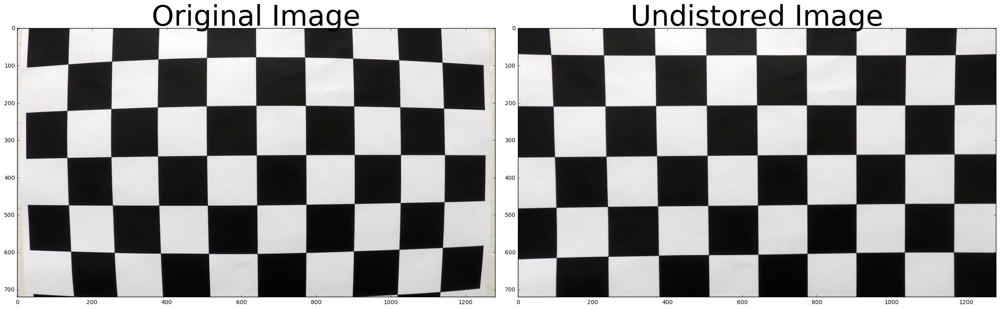

In [8]:
img_test = mpimg.imread('camera_cal/calibration1.jpg')
uimage = cv2.undistort(img_test, mtx, dist, None, mtx)
draw_plots(img_test, "Original Image", uimage, "Undistored Image")
save_to_output('undistorted_image.jpg', uimage)

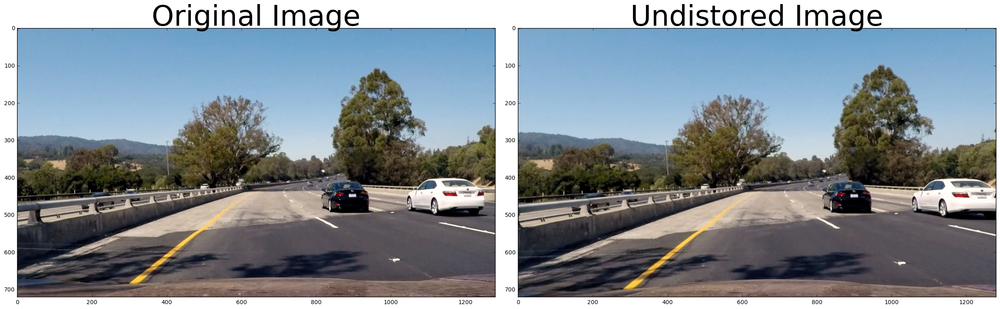

In [9]:
img_test = mpimg.imread('test_images/test4.jpg')
uimage = cv2.undistort(img_test, mtx, dist, None, mtx)
draw_plots(img_test, "Original Image", uimage, "Undistored Image")
save_to_output('undistorted_road_image.jpg', uimage)

### Sobel, Magnitude 

   * Sobel threshold helper
   * Magnitude threshold helper
   * Unwrap helper
   * Direction threshold

In [10]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    gradx = 1 if orient == 'x' else 0
    grady = 1 if orient == 'y' else 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, gradx, grady)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8( 255 * abs_sobel / np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

In [11]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [12]:
def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # 2) Convert to grayscale
    gray = cv2.cvtColor(undist,cv2.COLOR_RGB2GRAY)
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    print(ret)
    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(gray, (nx, ny), corners, ret)
        plt.imshow(gray)
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
                                     
        return warped, M


In [13]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

Apply different threshold methods and test pipeline

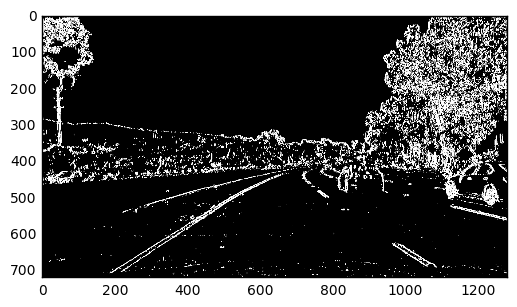

In [14]:
img_test = mpimg.imread('outfile/out_1485870524.005789.jpg')
uimage = cv2.undistort(img_test, mtx, dist, None, mtx)
gradx = abs_sobel_thresh(uimage, orient='x', thresh_min=10, thresh_max=250)
mag_binary = mag_thresh(uimage, sobel_kernel=15, mag_thresh=(100, 200))
dir_binary = dir_threshold(uimage, sobel_kernel=15, thresh=(np.pi/1, np.pi/2))
combined = np.zeros_like(dir_binary)
combined[((gradx == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
save_to_output('binary_thresholded.jpg', combined)
plt.imshow(combined, cmap='gray')

In [15]:
def warper(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

### Bird's Eye view (Perspective Transform)

In [16]:
def draw_lines(img, points):
    points = [tuple(x) for x in points]
    cv2.line(img,points[0],points[1],(255,0,0),5)
    cv2.line(img,points[1],points[2],(255,0,0),5)
    cv2.line(img,points[2],points[3],(255,0,0),5)
    cv2.line(img,points[3],points[0],(255,0,0),5)
    return img

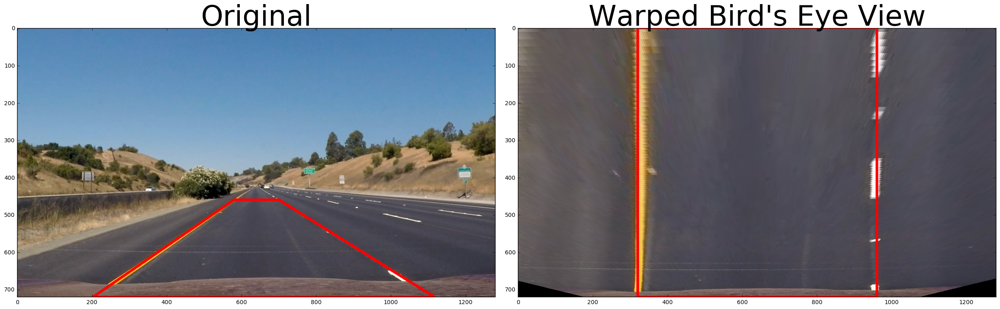

In [17]:

img_test = mpimg.imread('test_images/straight_lines1.jpg')
img_size = (img_test.shape[1], img_test.shape[0])
src = np.float32(
    [[(img_size[0] / 2) - 60, img_size[1] / 2 + 100],
    [((img_size[0] / 6)  - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 50, img_size[1]],
    [(img_size[0] / 2 + 60), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

# src = np.float32([[800, 500], [950, 585], [450, 585], [550, 500]])
# dst = np.float32([[990, 500], [990, 650], [400, 650], [400, 500]])

warped = warper(img_test, src, dst)
draw_plots(draw_lines(img_test, src), 'Original', draw_lines(warped, dst), "Warped Bird's Eye View")
save_to_output('birds-eye.jpg', warped)

# Channel Exploration of images

In [18]:
img_test = mpimg.imread('test_images/straight_lines1.jpg')

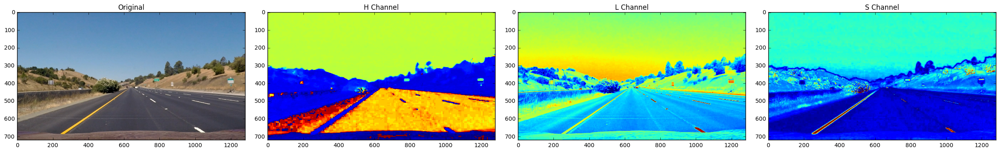

In [19]:
draw_img_variants(img_test)

### Color and Threshold Gradient

In [20]:
def color_gradient_threshold(img, s_thresh=(130, 255), sx_thresh=(45, 250)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.8, 1.2))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (dir_binary == 1)] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[((s_binary == 1) | (sxbinary == 1))] = 1
    return combined_binary, color_binary

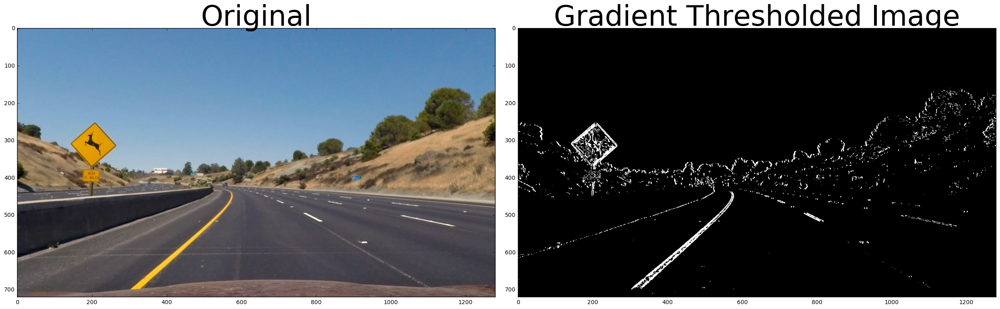

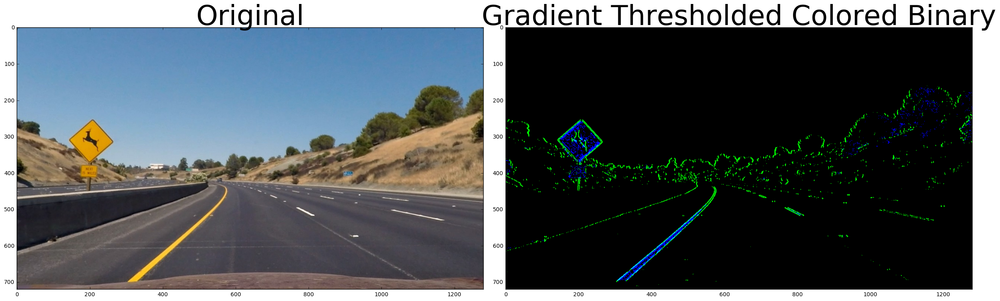

In [46]:
# img_test = mpimg.imread('outfile/out_1485870518.219037.jpg')
# img_test = mpimg.imread('outfile/out_1485870371.647219.jpg')
# img_test = mpimg.imread('outfile/out_1485870375.444886.jpg')
img_test = mpimg.imread('test_images/test2.jpg')
img_test = cv2.undistort(img_test, mtx, dist, None, mtx)
gradient_image, colored_binary = color_gradient_threshold(img_test)
draw_plots(img_test, 'Original', gradient_image, 'Gradient Thresholded Image', True)
draw_plots(img_test, 'Original', colored_binary, 'Gradient Thresholded Colored Binary')


(720, 1280)


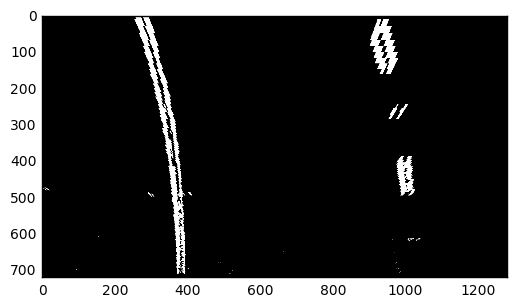

In [47]:
binary_warped = warper(gradient_image, src, dst)
plt.imshow(binary_warped, cmap='gray')
print(binary_warped.shape)

### Histogram Exploration

In [23]:
def histogram(img):
    histogram_img = np.sum(img[img.shape[0]/2:,:], axis=0)
    plt.plot(histogram_img)

/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:2: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  from ipykernel import kernelapp as app


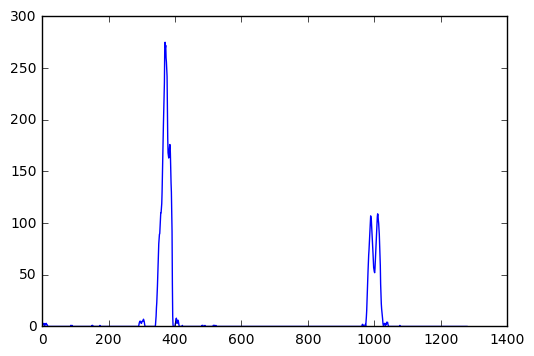

In [24]:
histogram(binary_warped)

### Polynomial Fit

Fit the polynomial as described in the videos. Use the sliding window to identify the left and right pixel that correspond to lane lines.

In [25]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_size = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_size
    win_y_high = binary_warped.shape[0] - window*window_size
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


/Users/shrikararchak/Anaconda/anaconda/envs/tensorflow/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


(720, 0)

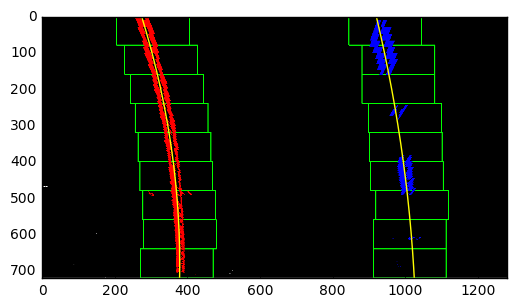

In [26]:
fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

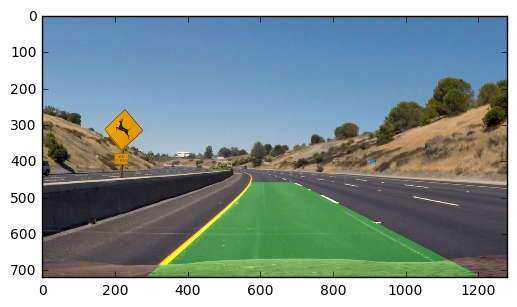

In [27]:
yvals = fity
image  = img_test
# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
Minv = cv2.getPerspectiveTransform(dst, src)
# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([fit_leftx, yvals]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, yvals])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(img_test, 1, newwarp, 0.3, 0)
plt.imshow(result)

In [31]:
y_eval = np.max(yvals)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)



2210.45999122 3942.67322031


In [359]:
import datetime

In [57]:
left_fit_avg = []
right_fit_avg = []
def pipeline(img):
    orig = np.copy(img)
    if img == None:
        print("NO DATA")
    ## Undistort the image
    img = cv2.undistort(img, mtx, dist, None, mtx)
    gradient_image, colored_binary = color_gradient_threshold(img)
    binary_warped = warper(gradient_image, src, dst)
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_size = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_size
        win_y_high = binary_warped.shape[0] - window*window_size
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Store fit coefficients
    left_fit_avg.append(left_fit)
    right_fit_avg.append(right_fit)
    
    # Mean of last 16 coefficients
    left_fit = np.mean(left_fit_avg[-16:], axis=0)
    right_fit = np.mean(right_fit_avg[-16:], axis=0)
    fity = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    fit_leftx = left_fit[0]*fity**2 + left_fit[1]*fity + left_fit[2]
    fit_rightx = right_fit[0]*fity**2 + right_fit[1]*fity + right_fit[2]
    yvals = fity
    image  = np.copy(img)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([fit_leftx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([fit_rightx, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(orig, 1, newwarp, 0.3, 0)
    y_eval = np.max(yvals)
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(fity * ym_per_pix, fit_leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(fity * ym_per_pix, fit_rightx * xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')

    screen_middel_pixel = img.shape[1]/2
    left_lane_pixel = fit_leftx[-1]    # x position for left lane
    right_lane_pixel = fit_rightx[-1]   # x position for right lane
    car_middle_pixel = int((right_lane_pixel + left_lane_pixel)/2)
    screen_off_center = screen_middel_pixel-car_middle_pixel
    meters_off_center = np.absolute(xm_per_pix * screen_off_center)

    cv2.rectangle(result, (0, img.shape[0] - 130), (img.shape[1], img.shape[0]),(0, 255, 0), -1)
    cv2.putText(result, "Radius of Curvature (right)      = %d (m)" %(int(right_curverad)) , (10,img.shape[0] - 100), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 3)    
    cv2.putText(result, "Radius of Curvature (left)       = %d (m)" %(int(left_curverad)) , (10,img.shape[0] - 60), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 3)
    cv2.putText(result, "Vehicle position, left of center = %.2f" % (meters_off_center) , (10,img.shape[0] - 20), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 3)
    plt.imshow(result)
    return result

array([[[ 95, 135, 184],
        [ 95, 135, 184],
        [ 95, 135, 184],
        ..., 
        [ 58, 116, 166],
        [ 58, 116, 166],
        [ 58, 116, 166]],

       [[ 95, 135, 184],
        [ 95, 135, 184],
        [ 95, 135, 184],
        ..., 
        [ 58, 116, 166],
        [ 58, 116, 166],
        [ 58, 116, 166]],

       [[ 95, 135, 184],
        [ 95, 135, 184],
        [ 95, 135, 184],
        ..., 
        [ 58, 116, 166],
        [ 58, 116, 166],
        [ 58, 116, 166]],

       ..., 
       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ..., 
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ..., 
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ..., 
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,

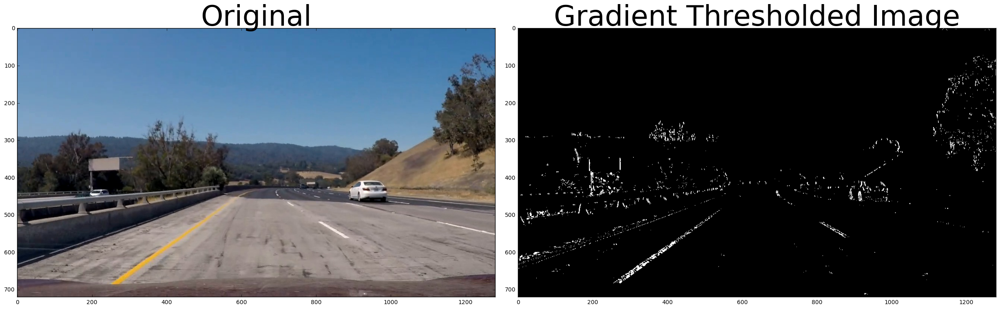

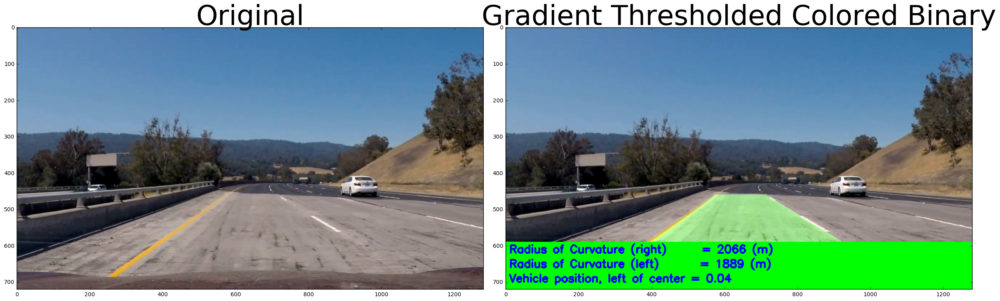

In [58]:
img_test = mpimg.imread('outfile/out_1485870375.444886.jpg')
gradient_image, colored_binary = color_gradient_threshold(img_test)
binary_warped = warper(gradient_image, src, dst)
draw_plots(img_test, 'Original', gradient_image, 'Gradient Thresholded Image', True)
draw_plots(img_test, 'Original', binary_warped, 'Gradient Thresholded Colored Binary')
pipeline(img_test)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [04:34<00:00,  4.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 4min 23s, sys: 1min 10s, total: 5min 34s
Wall time: 4min 34s


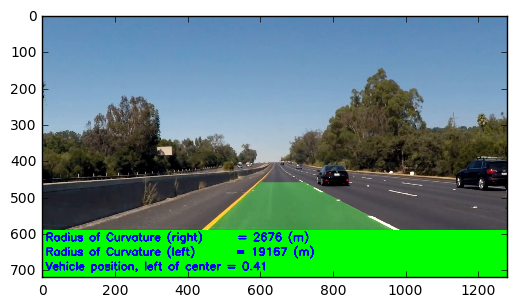

In [45]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from IPython.display import display
output = 'output.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

### Project Details

The pipeline works well when we have roads which are have clear demarcation on the road boundaries. In our case lets say if the road have the same material and the color of the tar its able to perform significantly well.

The pipeline fails to detect lines when we have road which have been patched or a new tar is laid on existing road and the lane markings have changed.  After working I personally think Computer vision projects are unforgiving when it comes to the parameters. A suitable and a robust approach would be to use deep learning with more data so that its able to learn from the data. Tuning computer vision problem to different condition and generalizing the parameter might be a bit more of work